# Data Exploration Notebook:

In [1]:
import os
import pydub
from pydub import AudioSegment
from pydub.utils import mediainfo
import regex as re
import librosa
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

### Count files and show filepaths:

In [2]:
vd_dir = os.path.join('..', 'voice_data')

In [3]:
# Go through our directory and get all of the file paths:
voice_files = [file for file in os.listdir(vd_dir) if re.match(r'[0-9]+\.wav', file)]

In [4]:
print('Number of files:', len(voice_files), '\n')
print(voice_files)

Number of files: 31 

['4175.wav', '4504.wav', '4708.wav', '4745.wav', '4823.wav', '4874.wav', '4889.wav', '4984.wav', '5000.wav', '5051.wav', '5220.wav', '5635.wav', '5926.wav', '6015.wav', '6062.wav', '6065.wav', '6093.wav', '6126.wav', '6157.wav', '6193.wav', '6239.wav', '6255.wav', '6278.wav', '6372.wav', '6379.wav', '6476.wav', '6862.wav', '6869.wav', '6899.wav', '6938.wav', '6952.wav']


#### We have 31 files in all, each labeled with a unique 4-digit number.

### Basic information for each file:

In [5]:
# Check basic info about each of the files using pydub's mediainfo:
for file in voice_files:
    file_path = os.path.join(vd_dir, file)
    file_info = mediainfo(file_path)
    print('File:', file_path, '|',
          'Number of Channels:', file_info['channels'], '|',
          'Sampling Rate:', file_info['sample_rate'], '|',
          'Duration (mins):', round((float(file_info['duration']) / 60), 2))

File: ../voice_data/4175.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/4504.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 7.85
File: ../voice_data/4708.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/4745.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 23.76
File: ../voice_data/4823.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/4874.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/4889.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 25.32
File: ../voice_data/4984.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/5000.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 30.0
File: ../voice_data/5051.wav | Number of Channels: 2 | Sampling Rate: 8000 | Duration (mins): 26.33
File: .

All of our files have 2 channels (stereo) and were sampled at a rate of 8kHz

Some of our audio files are pretty short at 7.85 minutes while most are 30 minutes long. Hopefully we'll have enough data from each file to use them for our project.

### Create some test audio clips to explore:

I found two examples of audio, one that seemed to be 2 men talking (4175.wav) and one that seemed to be 2 women talking (6938.wav).

I am interested in plotting some features of each and seeing what looks different.

In [6]:
test_fp_male = os.path.join(vd_dir, '4175.wav')
test_fp_female = os.path.join(vd_dir, '6938.wav')

test_audio_male = AudioSegment.from_file(test_fp_male)
test_audio_female = AudioSegment.from_file(test_fp_female)

In [7]:
# Create one minute of sample audio:
clip_start = 120000
clip_end = 180000

test_clip_male = test_audio_male[clip_start:clip_end]
test_clip_female = test_audio_female[clip_start:clip_end]

In [8]:
# Save the test audio clips as .wav files:
test_clip_male.export(out_f = 'test_clip_male.wav', format='wav')
test_clip_female.export(out_f = 'test_clip_female.wav', format='wav')

<_io.BufferedRandom name='test_clip_female.wav'>

In [9]:
test_clip_male_fp = 'test_clip_male.wav'
test_clip_female_fp = 'test_clip_female.wav'

In [10]:
# This will create an interactive button we can use to listen to the audio in the notebook!
ipd.Audio(test_clip_male_fp)

<i>They didn't break up! What a relief... Wait, what?! <i/>

In [11]:
ipd.Audio(test_clip_female_fp)

<i>That 'big asshole' is bad at giving gifts, apparently? Unbelievable... <i/>

There is a lot of noise in both of these clips, and that's likely to be present in other ones. We'll definitely need to look into reducing the background noise we see here to improve the quality of our voice recognition.

### Visualize some featres of this sample of the data:

Following the tutorial from here:

https://www.youtube.com/watch?v=3gzI4Z2OFgY&list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0&index=16

Based on related code from here:

https://github.com/musikalkemist/AudioSignalProcessingForML/tree/master/16%20-%20Extracting%20Spectrograms%20from%20Audio%20with%20Python

First load the file in with librosa, but we want to be careful to preserve the native sampling rate:

In [12]:
# librosa.load uses a default sampling rate of 22050, but we'll specify sr=None
# so that it preserves are native sampling rate (8kHz). Additionally, the default
# for mono is True so we'll need to set that to False since these are in stereo:
test_array_male, test_male_sr = librosa.load(test_clip_male_fp, sr=None, mono=False)
test_array_female, test_female_sr = librosa.load(test_clip_female_fp, sr=None, mono=False)

print('Sampling rate =', test_female_sr)

Sampling rate = 8000


Sampling rate preserved!

The librosa.load method returns a numpy array of our audio file:

In [13]:
print('Type:', type(test_array_female))
print('Shape:', test_array_female.shape)

Type: <class 'numpy.ndarray'>
Shape: (2, 480000)


Our arrays have 2 dimensions (stereo) of length 480,000. 480,000 because of the duration (60s) and the sampling rate (8kHz)

60s * 8000 samples/s = 480,000 samples * 2 channels = (2, 480000)

This basically represents the time domain features of our audio. Let's look at it visually.

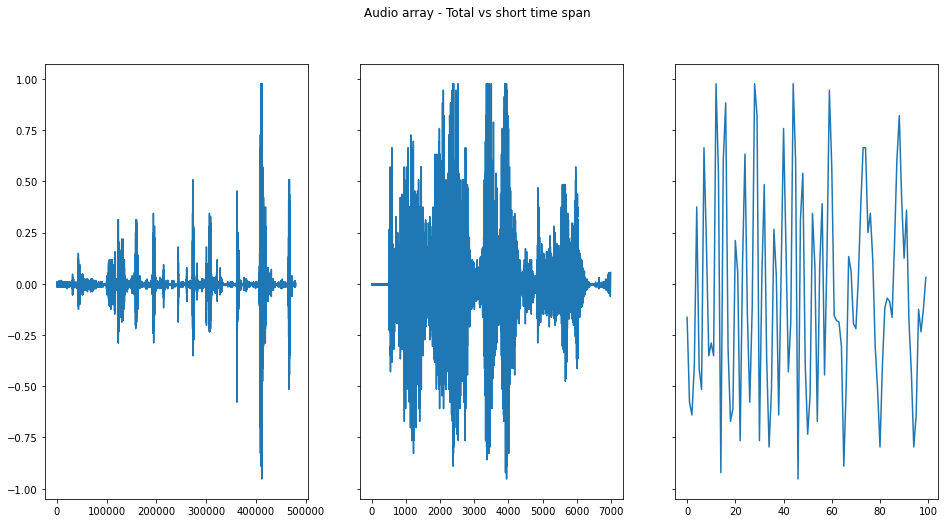

In [74]:
# Plot showing the full audio array and progressively smaller array sizes near the large spike a little after 400,000 samples using the same y-axis values for each
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), sharey=True)
fig.suptitle("Audio array - Total vs short time span")
ax1.plot(test_array_female[0])
ax2.plot(test_array_female[0][408000:415000])
ax3.plot(test_array_female[0][411900:412000])


You don't actually start seeing the complex waveforms that make up audio until the plot on the right, which is only a 12.5ms sample

#### Extract Short-Time Fourier Transform:

The output of the STFT will represent the frequency domain features of our audio:

In [14]:
# Declare frame and hop size:
FRAME_SIZE = 2048
HOP_SIZE = 512

# Call the librosa short-time fourier transform module:
test_male_ft = librosa.stft(test_array_male, n_fft = FRAME_SIZE, hop_length = HOP_SIZE)
test_female_ft = librosa.stft(test_array_female, n_fft = FRAME_SIZE, hop_length = HOP_SIZE)

print('FT Array shape:', test_female_ft.shape)

FT Array shape: (2, 1025, 938)


The shape of the array makes sense (Channels, Frequency Bins, Temporal Bins)

Look at one of the values:

In [15]:
print(test_female_ft[0][0][0])

(-1.9644098+0j)


Output of the fourier transform is a complex number! Interesting!

#### Calculating the Spectrogram

Take the squared magnitude of the short-time fourier transformation and then convert to log scale:

In [16]:
test_male_abs = np.abs(test_male_ft) ** 2
test_female_abs = np.abs(test_female_ft) ** 2

In [17]:
print('Shape stays the same:', test_female_abs.shape)
print(test_female_abs[0][0][0])

Shape stays the same: (2, 1025, 938)
3.858906


In [18]:
test_male_log = librosa.power_to_db(test_male_abs)
test_female_log = librosa.power_to_db(test_female_abs)

In [19]:
print('Shape stays the same:', test_female_log.shape)
print(test_female_log[0][0][0])

Shape stays the same: (2, 1025, 938)
5.864642


#### Visualizing the Spectrogram

In [20]:
def plot_spectromgram(Y,
                      sr,
                      hop_length,
                      y_axis = 'linear',
                      image_dir = '../images/'):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y,
                            sr = sr,
                            x_axis = 'time',
                            y_axis = y_axis)
    plt.colorbar(format="%+2.f")

We can't plot both channels simultaneously with this function, so we'll split them here:

In [21]:
test_male_log_ch1 = test_male_log[0]
test_male_log_ch2 = test_male_log[1]

test_female_log_ch1 = test_female_log[0]
test_female_log_ch2 = test_female_log[1]

##### Male Channel #1:

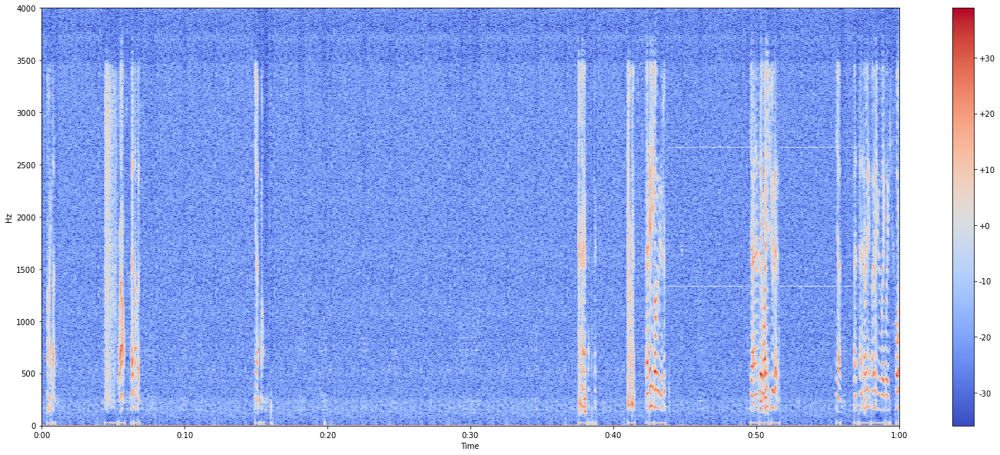

In [22]:
plot_spectromgram(test_male_log_ch1, sr = 8000, hop_length = HOP_SIZE)

##### Male Channel #2:

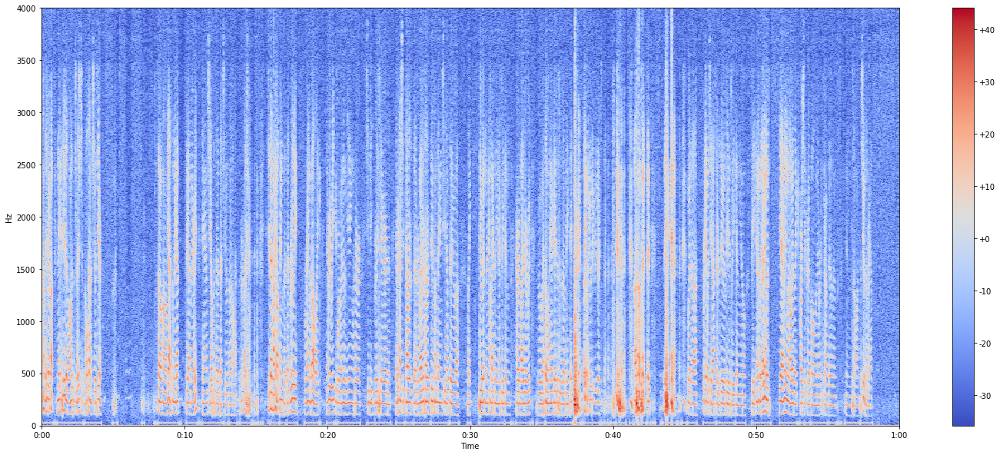

In [23]:
plot_spectromgram(test_male_log_ch2, sr = 8000, hop_length = HOP_SIZE)

##### Female Channel #1:

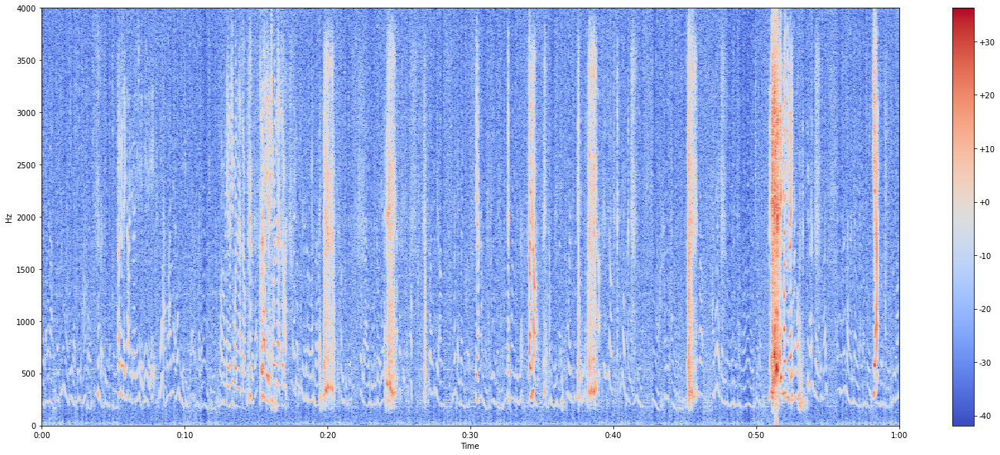

In [24]:
plot_spectromgram(test_female_log_ch1, sr = 8000, hop_length = HOP_SIZE)

##### Female Channel #2:

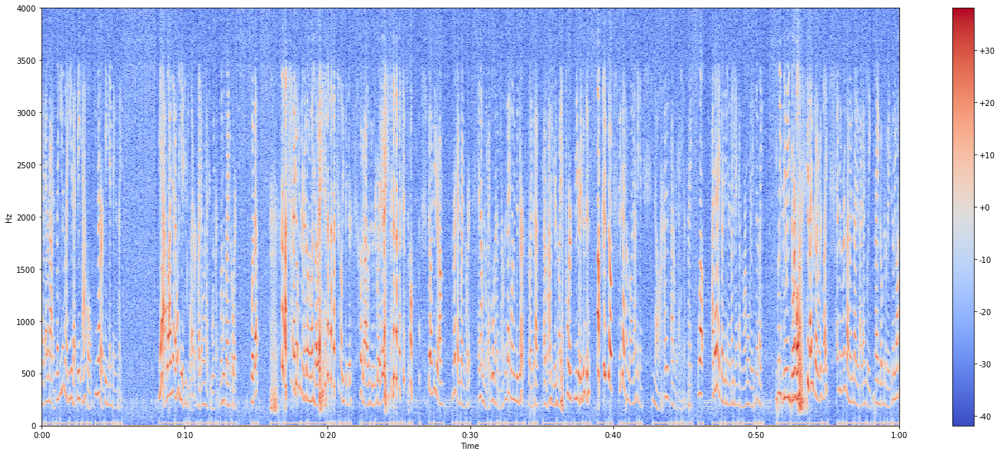

In [25]:
plot_spectromgram(test_female_log_ch2, sr = 8000, hop_length = HOP_SIZE)

Looks like the spike shortly after 50 seconds in these corresponds to a lot of high-pitched laughter! Interesting.

Overall, it seems like the female examples have more activity in the higher frequencies than the male examples, which makes intuitive sense.

### Exploring Mel Spectrograms

Based on tutorial here:

https://github.com/musikalkemist/AudioSignalProcessingForML/tree/master/18%20-%20Extracting%20Mel%20Spectrograms%20with%20Python

In [26]:
male_mel_spectrogram = librosa.feature.melspectrogram(y = test_array_male,
                                                 sr = 8000,
                                                 n_fft=2048,
                                                 hop_length=512,
                                                 n_mels=20)

female_mel_spectrogram = librosa.feature.melspectrogram(y = test_array_female,
                                                 sr = 8000,
                                                 n_fft=2048,
                                                 hop_length=512,
                                                 n_mels=20)

In [27]:
female_mel_spectrogram.shape

(2, 20, 938)

The shape still makes sense: (channels, n_mels, temporal bins)

In [28]:
log_male_mel_spectrogram = librosa.power_to_db(male_mel_spectrogram)
log_female_mel_spectrogram = librosa.power_to_db(female_mel_spectrogram)

In [29]:
# Split again into individual channels to plot:
ch1_male_mel_spectrogram = log_male_mel_spectrogram[0]
ch1_female_mel_spectrogram = log_female_mel_spectrogram[0]

ch2_male_mel_spectrogram = log_male_mel_spectrogram[1]
ch2_female_mel_spectrogram = log_female_mel_spectrogram[1]

In [30]:
def plot_mel_spectrogram(y):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(y, 
                             x_axis="time",
                             y_axis="mel", 
                             sr=8000)
    plt.colorbar(format="%+2.f")
    plt.show()

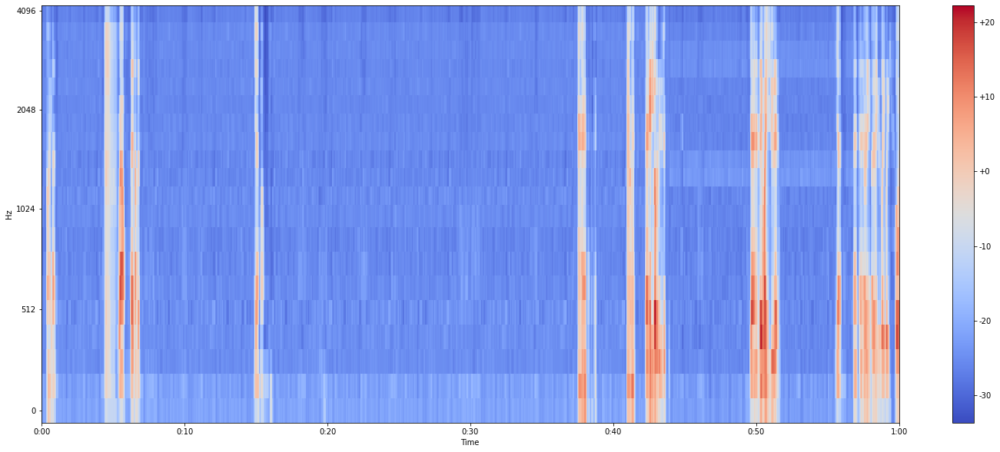

In [31]:
plot_mel_spectrogram(ch1_male_mel_spectrogram)

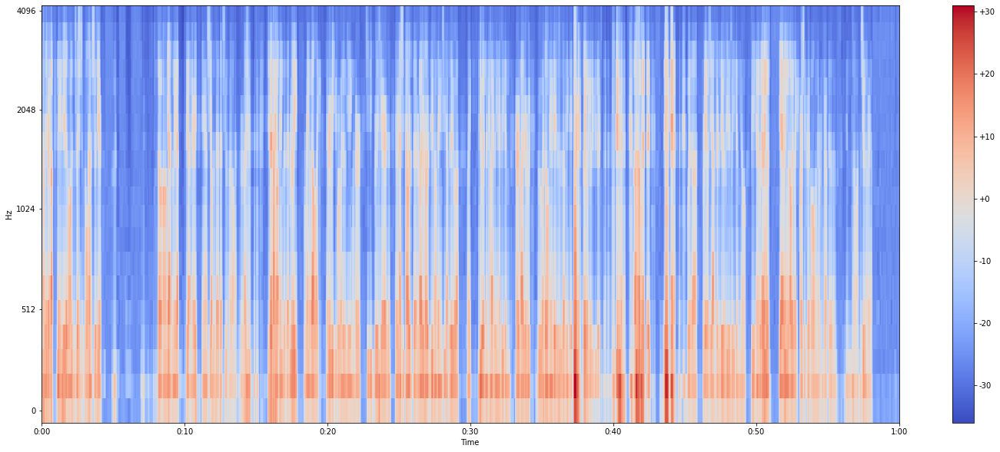

In [32]:
plot_mel_spectrogram(ch2_male_mel_spectrogram)

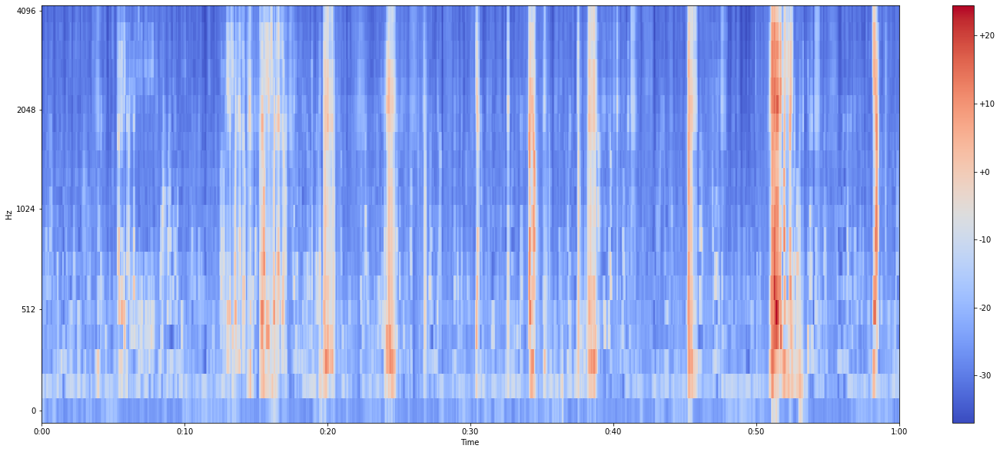

In [33]:
plot_mel_spectrogram(ch1_female_mel_spectrogram)

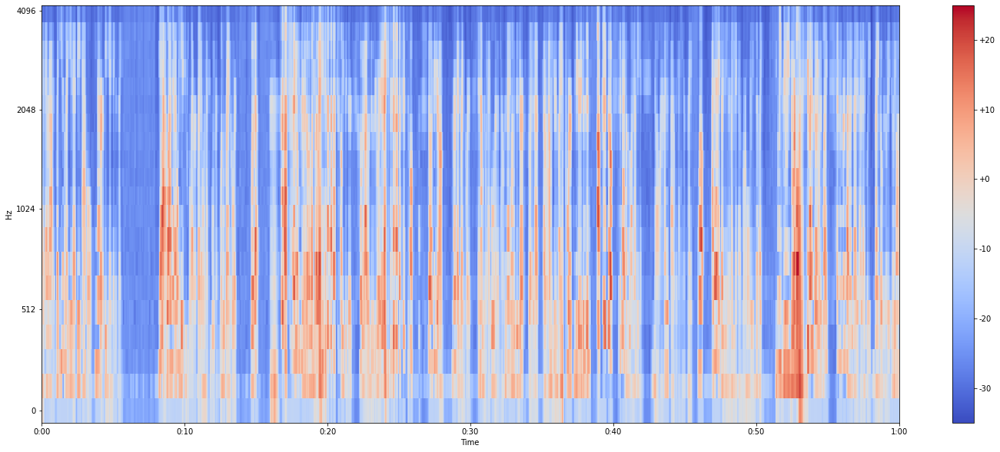

In [34]:
plot_mel_spectrogram(ch2_female_mel_spectrogram)

The Mel-Spectrograms are pretty fascinating, and will be an important feature in determining which voice we are listening to.

## Exploring MFCCs

MFCCs are similar to Mel Spectrograms, 